In [1]:
import numpy as np
from matplotlib import pyplot as plt
from utils import imgio as iio
import os

In [2]:
wl_to_ts = {
1010 : '10-34-21',
1045 : '10-32-14',
1080 : '10-21-21',
1100 : '10-11-55',
1120 : '10-13-51',
1140 : '10-14-48',
1160 : '10-15-24',
1180 : '10-15-55',
1200 : '10-17-20',
1220 : '10-17-53',
1240 : '10-19-59',
1260 : '10-20-31',
}

In [3]:
pref = '220105_Doc1_'
ch_sfx = [
    '_Doc1_PMT - PMT [2BLUE] _C00_Time Time0000.ome.tif',
    '_Doc1_PMT - PMT [5GREEN] _C01_Time Time0000.ome.tif',
    '_Doc1_PMT - PMT [6RED] _C02_Time Time0000.ome.tif',
    '_Doc1_PMT - PMT [7FarRED] _C03_Time Time0000.ome.tif',
    '_Doc1_PMT - PMT [8FarFarRED] _C04_Time Time0000.ome.tif',
]
def get_ch_fnames(ts):
    path = os.path.join(pref+ts, ts)
    fnames = [path+sfx for sfx in ch_sfx]
    return fnames

In [4]:
def load_ds(wl, chmap=[1, 2, 3, 4]):
    ts = wl_to_ts[wl]
    fnames = get_ch_fnames(ts)
    fnames = [fnames[i] for i in chmap]
    
    ds = [iio.read_mp_tiff(fn) for fn in fnames]
    ds = np.array(ds)
    return ds

In [5]:
all_ds = {wl: load_ds(wl) for wl in wl_to_ts}

In [6]:
all_ds_mip = {wl: ds.max(axis=1) for wl,ds in all_ds.items()}

In [7]:
all_ds_mip[1200].shape

(4, 574, 574)

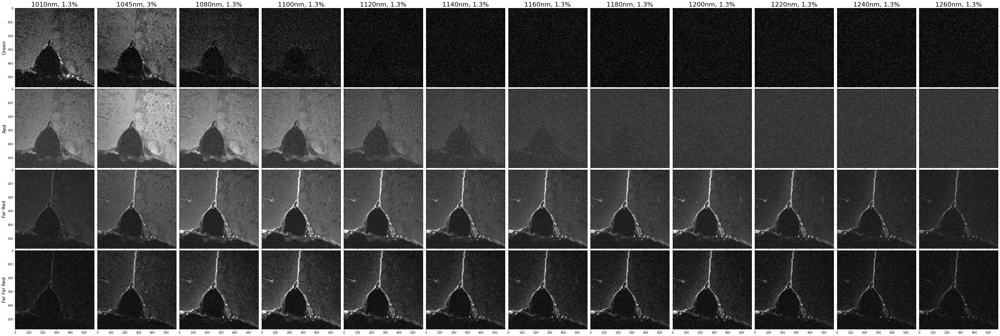

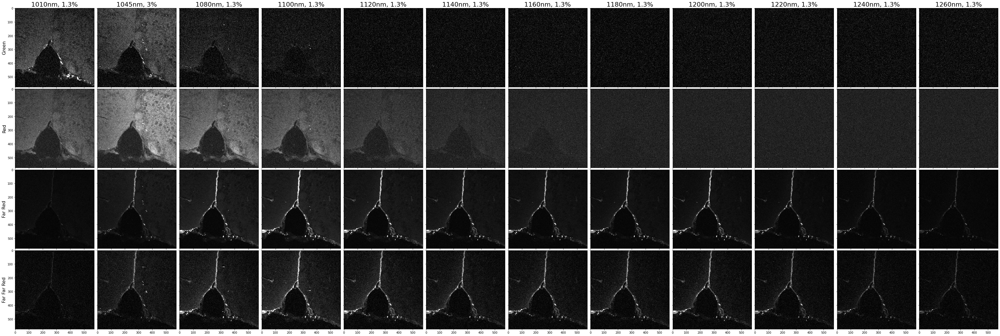

In [8]:
nx = len(all_ds_mip)
all_wl = list(all_ds_mip.keys())
ny = len(all_ds_mip[all_wl[0]])
s = 4

peaks = []
top = []
for do_log in [True, False]:
    fig, ax = plt.subplots(ny, nx, figsize=(nx*s, ny*s), sharey='all', sharex='all')
    for i in range(ny):
        all_ds = np.array([ds[i] for ds in all_ds_mip.values()]).flatten()
        nums, bins = np.histogram(all_ds, bins=1000)
        peak_idx = np.argmax(nums)
        peaks.append(bins[peak_idx])

        v_max = np.percentile(all_ds, 99.8)
        top.append(v_max)

    for i, (wl,ds) in enumerate(all_ds_mip.items()):
        for ch_idx, cds in enumerate(ds):
            if do_log:
                im = np.log(cds+1)
                ax[ch_idx][i].imshow(im, cmap='gray', vmin=np.log(peaks[ch_idx]), vmax=np.log(top[ch_idx]))
            else:
                im = cds
                ax[ch_idx][i].imshow(im, cmap='gray', vmin=peaks[ch_idx], vmax=top[ch_idx])

    for i in range(nx):
        wl = all_wl[i]
        ttl = f'{wl}nm, ' + ('3%' if wl==1045 else '1.3%')
        ax[0][i].set_title(ttl, size=22)

    channel_names = ['Green', 'Red', 'Far Red', 'Far Far Red']
    for i in range(ny):
        ax[i][0].set_ylabel(f'{channel_names[i]}', size=16)
    plt.tight_layout(pad=0, h_pad=0, w_pad=0)
    plt.show()
    plt.close()

In [9]:
# zoom: 
all_ds_mip_z = {k:v[:, 0:300, 250:300] for k, v in all_ds_mip.items()}

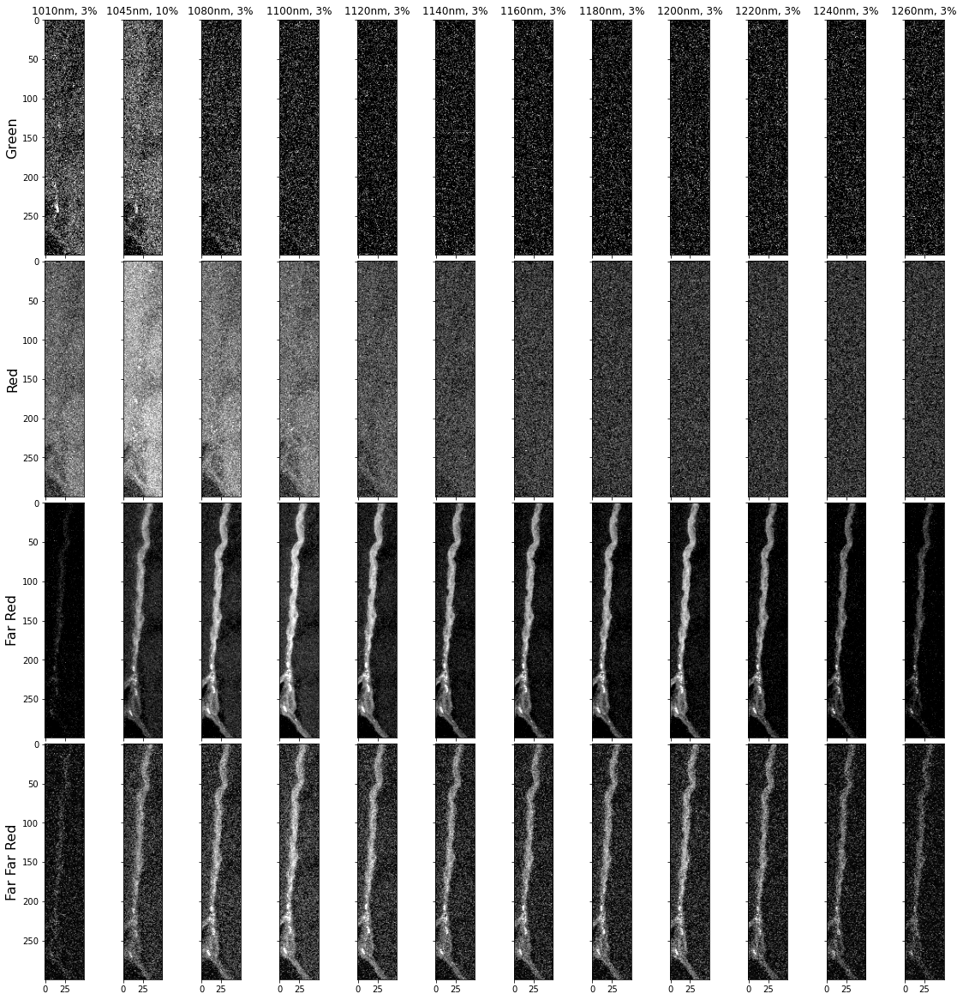

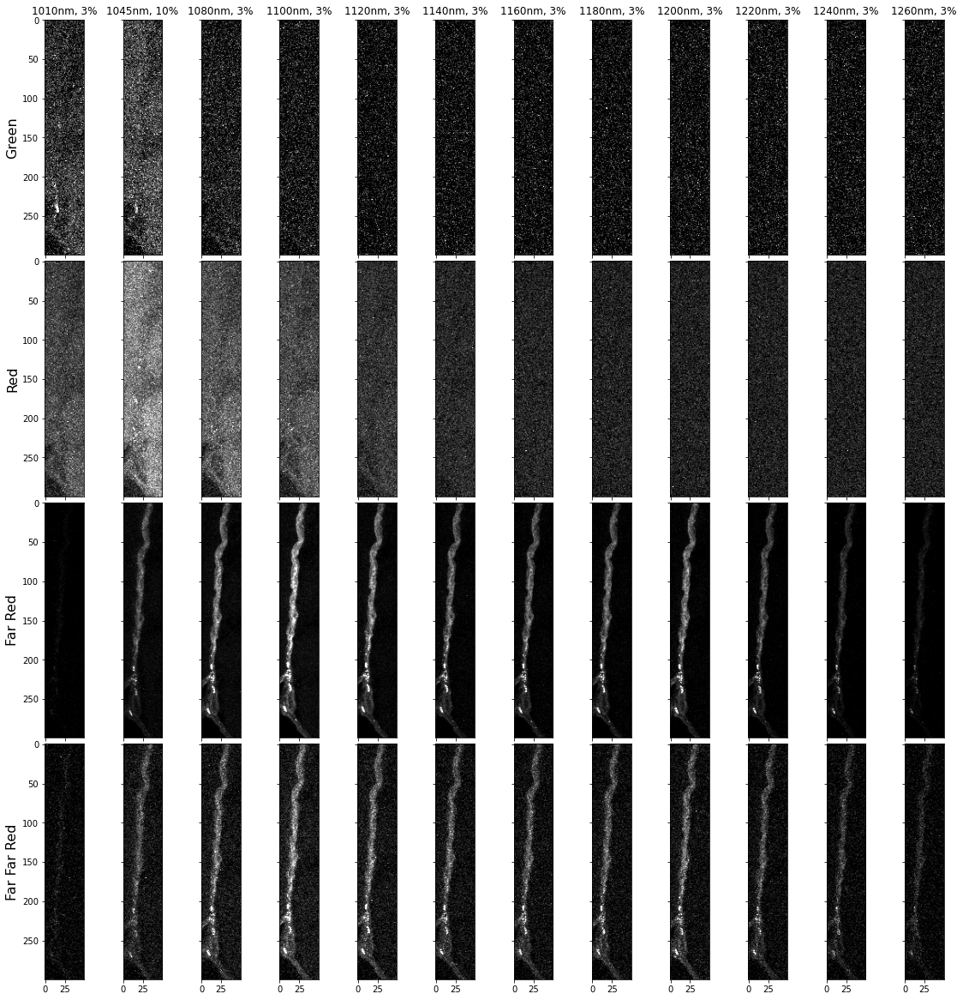

In [10]:
nx = len(all_ds_mip_z)
all_wl = list(all_ds_mip_z.keys())
ny = len(all_ds_mip_z[all_wl[0]])
s = 4

peaks = []
top = []

for do_log in [True, False]:
    fig, ax = plt.subplots(ny, nx, figsize=(nx*s//3, ny*s), sharey='all', sharex='all')

    for i in range(ny):
        all_ds = np.array([ds[i] for ds in all_ds_mip_z.values()]).flatten()
        nums, bins = np.histogram(all_ds, bins=1000)
        peak_idx = np.argmax(nums)
        peaks.append(bins[peak_idx])

        v_max = np.percentile(all_ds, 99.8)
        top.append(v_max)

    for i, (wl,ds) in enumerate(all_ds_mip_z.items()):
        for ch_idx, cds in enumerate(ds):
            if do_log:
                im = np.log(cds+1)
                ax[ch_idx][i].imshow(im, cmap='gray', vmin=np.log(peaks[ch_idx]), vmax=np.log(top[ch_idx]))
            else:
                im = cds
                ax[ch_idx][i].imshow(im, cmap='gray', vmin=peaks[ch_idx], vmax=top[ch_idx])

    for i in range(nx):
        wl = all_wl[i]
        ttl = f'{wl}nm, ' + ('10%' if wl==1045 else '3%')
        ax[0][i].set_title(ttl, size=12)

    channel_names = ['Green', 'Red', 'Far Red', 'Far Far Red']
    for i in range(ny):
        ax[i][0].set_ylabel(f'{channel_names[i]}', size=16)
    plt.tight_layout(pad=0, h_pad=0, w_pad=0)
    plt.show()
    plt.close()

In [11]:
a = all_ds_mip[1200][1]
a.min(), a.mean(), np.percentile(a, 99.8), a.max()

(326, 455.73360730371866, 810.0, 1821)

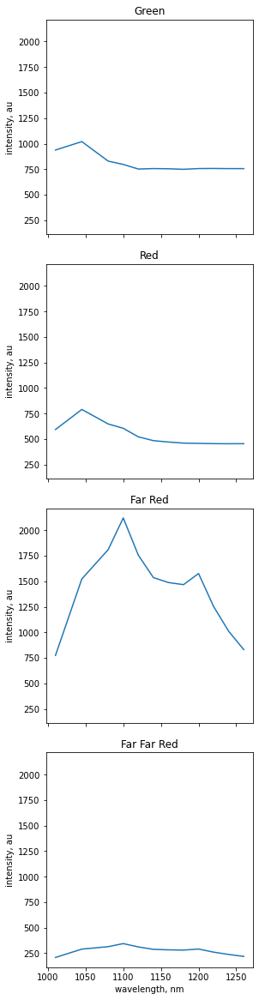

In [12]:
means = np.array([[ all_ds_mip_z[wl][ch].mean() for wl in all_wl] for ch in range(ny)])

fig, ax = plt.subplots(ny, 1, figsize=(s, ny*s), sharey='all', sharex='all')

for ch in range(ny):
    ax[ch].plot(all_wl, means[ch])
    ax[ch].set_title(channel_names[ch])
    ax[ch].set_ylabel('intensity, au')

ax[ny-1].set_xlabel('wavelength, nm')
plt.tight_layout(pad=0, h_pad=1.5, w_pad=0)
plt.show()
plt.close()